# Libraries import & setup

In [1]:
!pip install diffusers accelerate transformers safetensors --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.6 MB/s eta 0:00:00


In [2]:
!pip install -U peft --quiet

In [3]:
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler, StableDiffusionImg2ImgPipeline
from huggingface_hub import InferenceClient, hf_hub_download, login
from IPython.display import Image as IPyImage, display
from PIL import Image
import torch
import ast
import re
import os
import cv2
import numpy as np
from openai import OpenAI
import openai

In [4]:
from diffusers import StableDiffusionControlNetImg2ImgPipeline, ControlNetModel
from diffusers.utils import load_image
from diffusers import UniPCMultistepScheduler
from diffusers.utils import load_image
from torchvision import transforms

In [ ]:
login(token="")

# Step 1: Producing consistent frames via GPT-4o

In [ ]:
client = InferenceClient(
    provider="hf-inference",
    api_key="",
)

def generate_animation_frames(prompt, steps):
    system_message = (
        f"You are an animation assistant to help create ghibli-themed animation frames. "
        f"**Each frame must include the word 'ghibli' or describe the frame as 'ghibli-style'.** "
        f"Break the given ghibli-themed idea into a smooth {steps}-step animation, keeping each frame very simple. "
        f"Do not stray from the given ghibli idea, simple break it into frames that I can use to create a smooth and consistent ghibli animation. "
        f"Each frame must describe only the current ghibli scene, and it must be a simple description. "
        f"Return the result as a **Python list of {steps} strings**, where each string describes a single still frame. "
        f"Do NOT include any titles, explanations, code, formatting, or object coordinates — only a plain list of strings."
        f"Here is an example:\n['A ghibli-themed boy opens a door.', 'He steps into a ghibli glowing forest.', ...]"
    )

    completion = client.chat.completions.create(
        model="mistralai/Mistral-7B-Instruct-v0.3",
        messages=[
            {"role": "system", "content": system_message},
            {"role": "user", "content": prompt}
        ]
    )

    return completion.choices[0].message.content

In [7]:
def normalize_llm_frame_output(raw_output, steps):
    # Try parsing as a Python list (only if it starts and ends with brackets)
    if raw_output.strip().startswith("[") and raw_output.strip().endswith("]"):
        try:
            parsed = ast.literal_eval(raw_output)
            if isinstance(parsed, list) and all(isinstance(item, str) for item in parsed):
                return parsed[:steps]
        except Exception:
            pass

    # Fallback 1: Numbered lines like 1. "..."
    pattern = re.compile(r'\d+\s*[\.\)]\s*["“]?(.*?)["”]?(?=\n\d+|\Z)', re.DOTALL)
    matches = pattern.findall(raw_output)

    # Fallback 2: Bullet points or stray quoted lines
    if not matches:
        matches = re.findall(r'["“”\']([^"\n]+)["“”\']', raw_output)

    # Fallback 3: Rough line-by-line fallback if nothing matches
    if not matches:
        matches = [line.strip("-• \n") for line in raw_output.splitlines() if len(line.strip()) > 3]

    # Clean up stray characters
    cleaned = []
    for m in matches[:steps]:
        m = m.replace("‘", "").replace("’", "'").replace("“", "").replace("”", "").strip()
        cleaned.append(m)

    return cleaned

---
# Step 2: text-to-image for first frame

In [ ]:
base_model = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(base_model, safety_checker=None, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

In [9]:
lora_repo = "ibrahim7004/ghibli-stableDiff-finetuned"
lora_filename = "v2_pytorch_lora_weights.safetensors"

lora_path = hf_hub_download(repo_id=lora_repo, filename=lora_filename)
pipe.unet.load_attn_procs(lora_path)

v2_pytorch_lora_weights.safetensors:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


In [10]:
def save_img(image, idx, output_dir="/content/frames"):
    os.makedirs(output_dir, exist_ok=True)
    image_path = os.path.join(output_dir, f"frame_{idx}.png")
    image.save(image_path)

    init_image = Image.open(image_path).convert("RGB")
    init_image = init_image.resize((512, 512))
    return init_image

----
# Step 3: img2img for remaining frames

In [11]:
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    safety_checker=None,
    torch_dtype=torch.float16
).to("cuda")

img2img_pipe.unet.load_attn_procs(lora_path)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


---

In [13]:
def create_gif_from_frames(folder_path="/content/frames", output_path="/content/animation.gif", duration=300):

    frames = sorted(
        [Image.open(os.path.join(folder_path, f)) for f in os.listdir(folder_path) if f.endswith(".png")],
        key=lambda x: int(os.path.splitext(os.path.basename(x.filename))[0].split('_')[-1])
    )

    frames[0].save(output_path, format="GIF", save_all=True, append_images=frames[1:], duration=duration, loop=0)
    print(f"GIF saved to {output_path}")

    display(IPyImage(filename=output_path))

In [33]:
def blend_frames(img1, img2, alpha):
    return Image.blend(img1, img2, alpha)

def create_smooth_gif(folder_path="/content/frames", output_path="/content/animation.gif", duration=300):
    frame_files = sorted(
        [f for f in os.listdir(folder_path) if f.endswith(".png")],
        key=lambda x: int(x.split('_')[-1].split('.')[0])
    )
    frames = [Image.open(os.path.join(folder_path, f)).convert("RGB") for f in frame_files]

    # Add blended frames between originals
    smooth_frames = []
    for i in range(len(frames) - 1):
        smooth_frames.append(frames[i])
        blend = blend_frames(frames[i], frames[i+1], alpha=0.5)
        smooth_frames.append(blend)
    smooth_frames.append(frames[-1])

    smooth_frames[0].save(
        output_path,
        format="GIF",
        save_all=True,
        append_images=smooth_frames[1:],
        duration=duration,
        loop=0
    )
    print(f"Smooth GIF saved to {output_path}")
    display(IPyImage(filename=output_path))

# Control Net Pipeline

In [ ]:
# Load depth-based ControlNet
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-depth", torch_dtype=torch.float16
)

# Replace img2img_pipe with a ControlNet version
img2img_pipe = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

img2img_pipe.scheduler = UniPCMultistepScheduler.from_config(img2img_pipe.scheduler.config)

img2img_pipe.unet.load_attn_procs(lora_path)

In [16]:
import cv2
import numpy as np

def get_depth_map(image_pil):
    image = np.array(image_pil.convert("RGB"))
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    depth = cv2.normalize(gray, None, 0, 255, cv2.NORM_MINMAX)
    depth_image = Image.fromarray(depth).convert("RGB")
    return depth_image


In [38]:
def generate_frames(frames):
    saved_image = None
    seed = 42
    generator = torch.Generator(device="cuda").manual_seed(seed)

    for idx, frame in enumerate(frames):
        if idx == 0:
            image = pipe(
                prompt=frame,
                num_inference_steps=50,
                guidance_scale=8.5,
                generator=generator
            ).images[0]
            saved_image = save_img(image, idx)
            display(image)
        else:
            refined = img2img_pipe(
                prompt=frame,
                image=saved_image,
                control_image=get_depth_map(saved_image),
                strength=0.15,  # image
                guidance_scale=8.5, # prompt
                num_inference_steps=50,
                generator=generator
            ).images[0]
            display(refined)
            saved_image = save_img(refined, idx)

# Main

- a serene ghibli-style forest with glowing sunlight passing through lush ghibli trees, the trees sway as wind passes and the light flickers as the camera pans through the leaves of the trees
- A ghibli-style river gently flows through a moss-covered valley, glimmering in the morning light as birds flutter past and ripples reflect on the water
- The camera pans through a ghibli-themed scene of a mountain path surrounded by blooming wildflowers, trees swaying slightly, and butterflies drifting in the warm breeze

Enter an animation sequence: The camera pans through a ghibli-themed scene of a mountain path surrounded by blooming wildflowers, trees swaying slightly, and butterflies drifting in the warm breeze
[
"A wide shot of a ghibli mountain path lined with blooming wildflowers.",
"The path begins to curve, leading deeper into the scenic landscape.",
"The sun casts dappled light through the leaves of the trees.",
"Butterflies flit playfully among the flowers on the side of the path.",
"A gentle zepplin-like airship floats slowly overhead.",
"The path descends slightly, revealing a quaint ghibli-style village below.",
"A winding river snakes its way past the village, visible from the path.",
"The village is bustling with activity, people going about their day.",
"A ghibli cat bus, laden with cuddly passengers, rolls past the path.",
"The path leads to a picturesque ghibli-themed bridge over the river.",
"The bridge is adorned with intricate carvings, typical of ghibli art.",
"A tiny, fantastica

  0%|          | 0/50 [00:00<?, ?it/s]

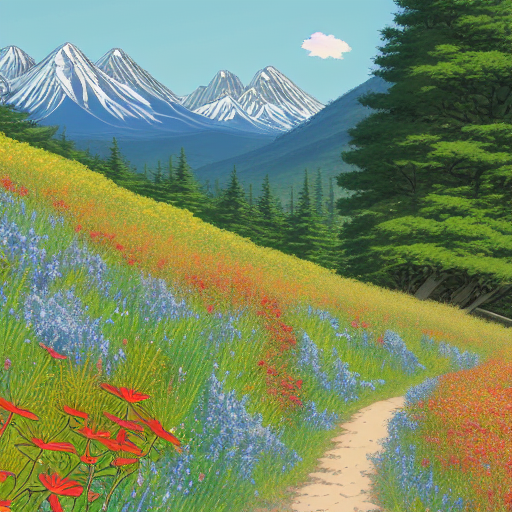

  0%|          | 0/7 [00:00<?, ?it/s]

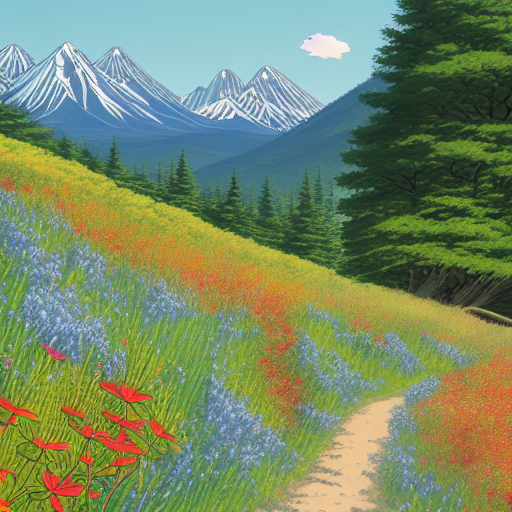

  0%|          | 0/7 [00:00<?, ?it/s]

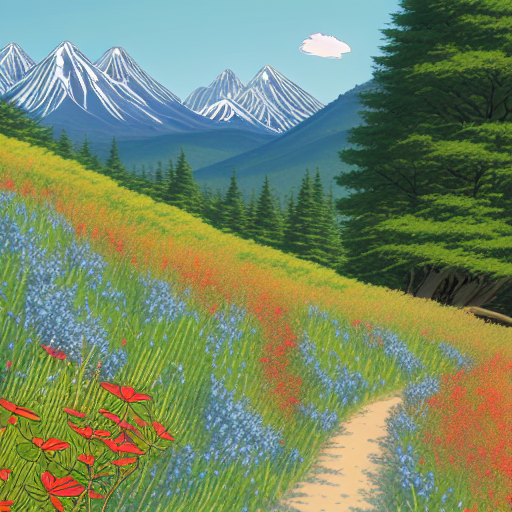

  0%|          | 0/7 [00:00<?, ?it/s]

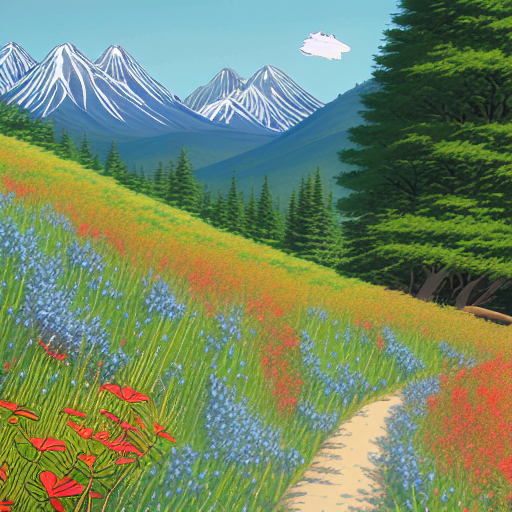

  0%|          | 0/7 [00:00<?, ?it/s]

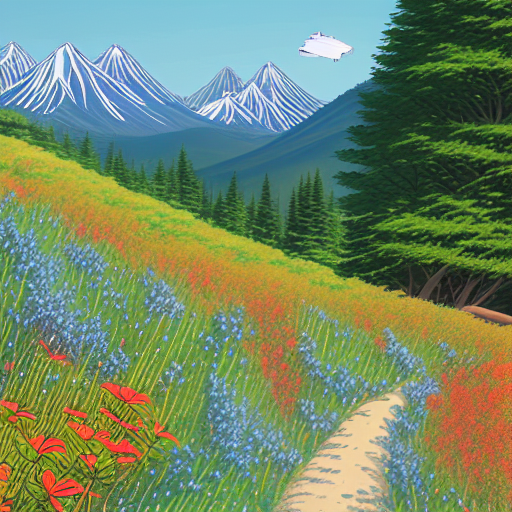

  0%|          | 0/7 [00:00<?, ?it/s]

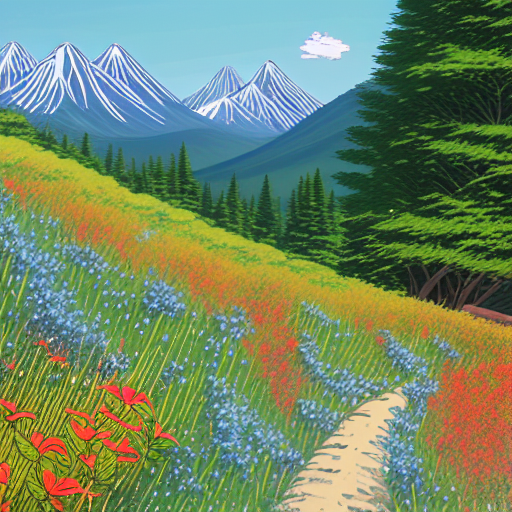

  0%|          | 0/7 [00:00<?, ?it/s]

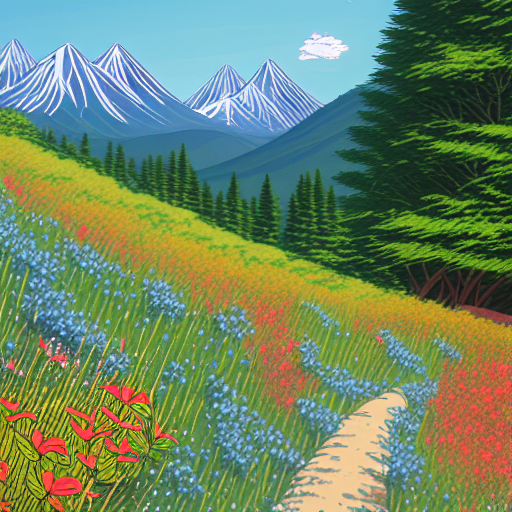

  0%|          | 0/7 [00:00<?, ?it/s]

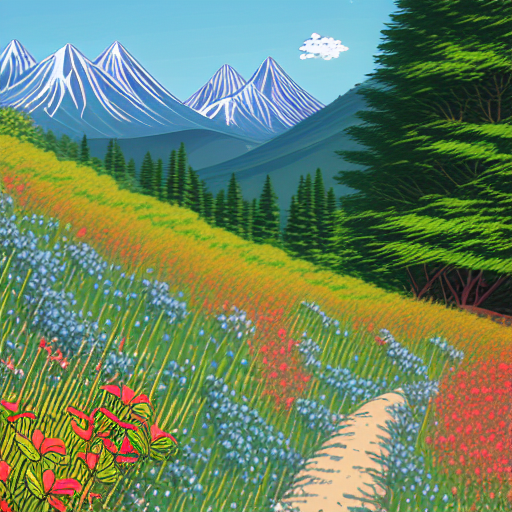

  0%|          | 0/7 [00:00<?, ?it/s]

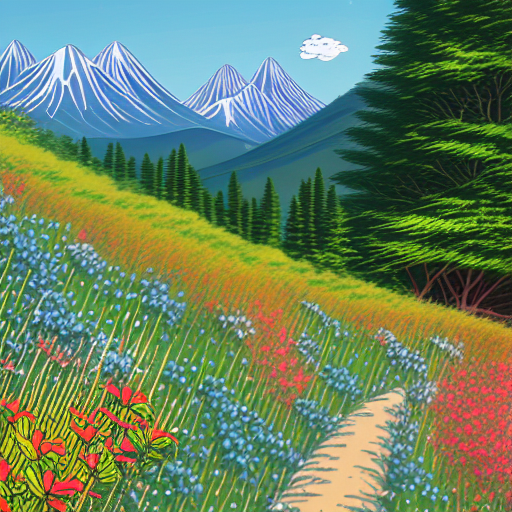

  0%|          | 0/7 [00:00<?, ?it/s]

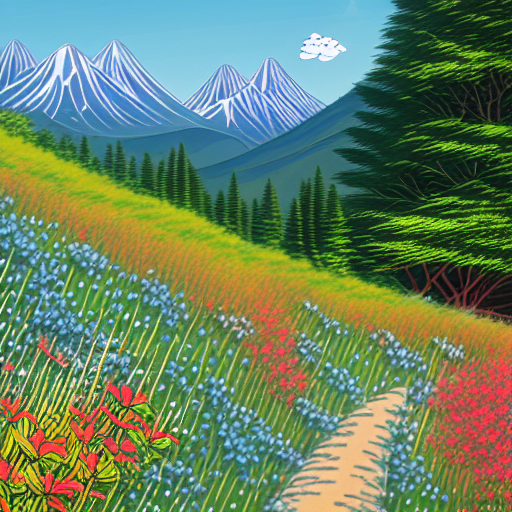

  0%|          | 0/7 [00:00<?, ?it/s]

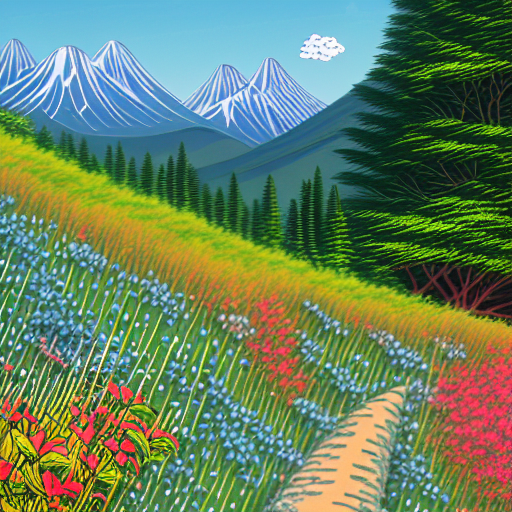

  0%|          | 0/7 [00:00<?, ?it/s]

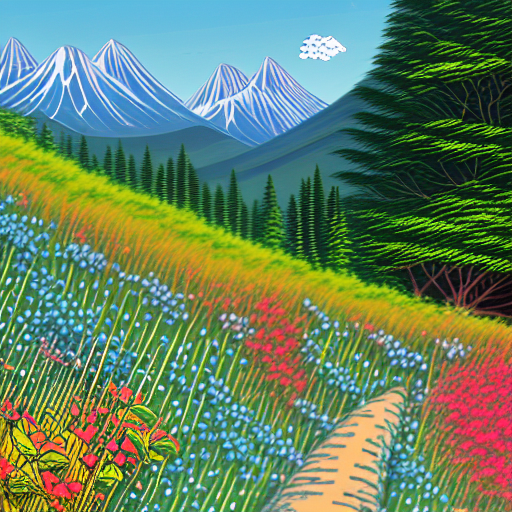

In [41]:
result = generate_animation_frames(input("Enter an animation sequence: "), 20)
print(result)
frames = normalize_llm_frame_output(result, 12)
print(frames)
generate_frames(frames)

GIF saved to /content/animation.gif


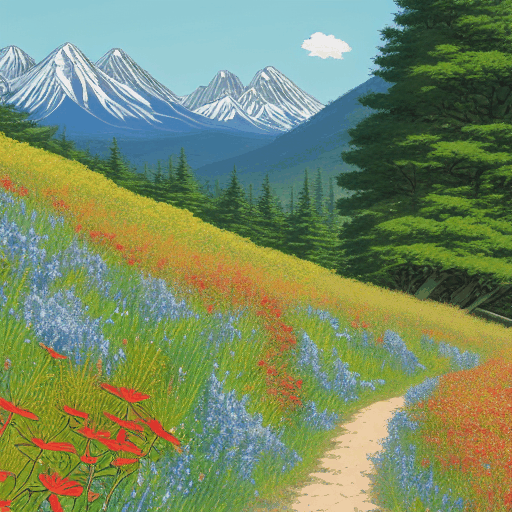

In [45]:
create_gif_from_frames()

Smooth GIF saved to /content/animation.gif


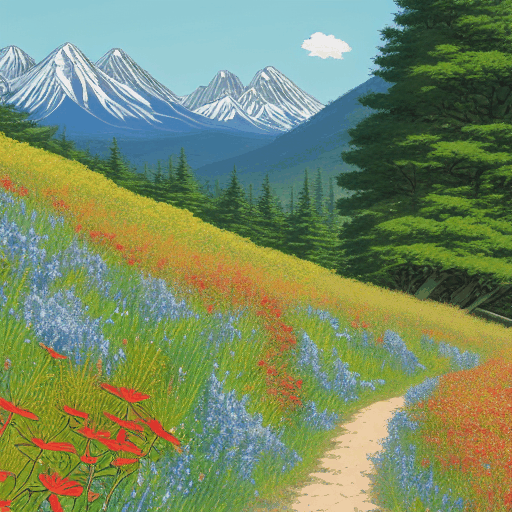

In [46]:
create_smooth_gif()

---